In [1]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
from utils import *
from scipy import signal
from scipy.ndimage import maximum_filter, generate_binary_structure
import matplotlib.pyplot as plt

In [2]:
def gaussian_kernel(size, sigma):
    """Generate a 2D Gaussian kernel."""
    size = int(size)
    x, y = np.mgrid[-(size//2):(size//2)+1, -(size//2):(size//2)+1]
    g = np.exp(-(x**2 + y**2)/(2*sigma**2))
    return g / g.sum()

In [3]:
def harris(I, N=100, **kwargs):
    """
    Harris corner detector.
    This function implements a version of the Harris corner detector which
    has the ability to calculate the eigenvalues of the gradient matrix
    directly.  This is opposed to calculating the corner response function as
    originally proposed by Harris in:

    C. Harris and M. Stephens.  "A Combined Corner and Edge
    Detector", Proceedings of the 4th Alvey Vision Conference,
    Manchester, U.K. pgs 147-151, 1988
    
    INPUT:
        I: grayscale image
    PARAMETERS:
        N: maximum number of interest points to return
        disp: whether to display results
        thresh: threshold value for smallest acceptable value of response function
        hsize: size of the smoothing Gaussian mask
        sigma: standard deviation of the Gaussian filter
        tile: list [y, x], break the image into regions to distribute feature points more uniformly
        mask: array of ones defining where to compute feature points
        eig: use smallest eigenvalue as response function
        fft: perform smoothing filtering in frequency domain
    OUTPUT:
        y, x: row/column locations of interest points
        m: corner response function value associated with that point
    """
    param = {
        'disp': False,
        'N': N,
        'thresh': 0.01,
        'hsize': 3,
        'sigma': 0.5,
        'eig': False,
        'tile': [1,1],
        'mask': None,
        'fft': False,
    }
    param.update(kwargs)

    I = I.astype(np.float64)

    nr, nc = I.shape

    # Create gradient masks
    dx = np.array([[-1, 0, 1],
                   [-1, 0, 1],
                   [-1, 0, 1]], dtype=np.float64) / 3

    dy = dx.T

    # Calculate image gradients
    Ix = signal.convolve2d(I, dx, boundary='symm', mode='same')
    Iy = signal.convolve2d(I, dy, boundary='symm', mode='same')

    # Calculate gradient products
    IxIx = Ix * Ix
    IyIy = Iy * Iy
    IxIy = Ix * Iy

    # Smooth squared image gradients
    hsize = param['hsize']
    sigma = param['sigma']

    gmask = gaussian_kernel(hsize, sigma)

    if not param['fft']:
        IxIx = signal.convolve2d(IxIx, gmask, boundary='symm', mode='same')
        IyIy = signal.convolve2d(IyIy, gmask, boundary='symm', mode='same')
        IxIy = signal.convolve2d(IxIy, gmask, boundary='symm', mode='same')
    else:
        # Perform convolution in frequency domain
        m = IxIx.shape[0] + gmask.shape[0] - 1
        n = IxIx.shape[1] + gmask.shape[1] - 1
        G = np.fft.fft2(gmask, s=(m,n))
        IxIx = np.real(np.fft.ifft2(np.fft.fft2(IxIx, s=(m,n)) * G))
        IyIy = np.real(np.fft.ifft2(np.fft.fft2(IyIy, s=(m,n)) * G))
        IxIy = np.real(np.fft.ifft2(np.fft.fft2(IxIy, s=(m,n)) * G))
        # Keep 'same' portion
        w = (hsize - 1) // 2  # hsize is assumed to be odd
        IxIx = IxIx[w:w+nr, w:w+nc]
        IyIy = IyIy[w:w+nr, w:w+nc]
        IxIy = IxIy[w:w+nr, w:w+nc]

    # Calculate the eigenvalues
    B = IxIx + IyIy
    sqrt_term = np.sqrt(np.maximum(B**2 - 4 * (IxIx * IyIy - IxIy**2), 0))
    
    
    lambda1 = (B + sqrt_term) / 2
    lambda2 = (B - sqrt_term) / 2

    # Corner response function
    if param['eig']:
        # Minimum eigenvalue
        R = np.minimum(lambda1, lambda2)
    else:
        # Harris corner response function
        R = lambda1 * lambda2 - 0.04 * (lambda1 + lambda2)**2

    # Apply mask if provided
    if param['mask'] is not None:
        mask = param['mask']
        if mask.shape != R.shape:
            raise ValueError("Mask must be the same size as the image.")
    else:
        mask = np.ones_like(R, dtype=bool)

    # Find local maxima
    neighborhood = generate_binary_structure(2, 2)
    local_max = (R == maximum_filter(R, footprint=neighborhood))
    Maxima = (local_max & mask)
    Maxima_R = Maxima * R

    # Get indices where Maxima > thresh
    indices = np.argwhere(Maxima_R > param['thresh'])
    m_values = Maxima_R[indices[:,0], indices[:,1]]

    # Sort interest points by response function
    sorted_indices = np.argsort(m_values)
    # Flip so largest response points are first
    sorted_indices = sorted_indices[::-1]

    i = indices[sorted_indices,0]
    j = indices[sorted_indices,1]
    m = m_values[sorted_indices]

    # Process image regionally
    tile = param['tile']
    if tile[0] > 1 and tile[1] > 1:
        ii = []
        jj = []
        mm = []
        Npts_per_region = int(round(param['N'] / (tile[0]*tile[1])))
        xx = np.round(np.linspace(0, nc, tile[1]+1)).astype(int)
        yy = np.round(np.linspace(0, nr, tile[0]+1)).astype(int)
        for pp in range(1, len(xx)):
            idx = np.where((j >= xx[pp-1]) & (j < xx[pp]))[0]
            for qq in range(1, len(yy)):
                idy = np.where((i >= yy[qq-1]) & (i < yy[qq]))[0]
                ind = np.intersect1d(idx, idy)
                ind = ind[:min(len(ind), Npts_per_region)]
                ii.extend(i[ind])
                jj.extend(j[ind])
                mm.extend(m[ind])
        ii = np.array(ii)
        jj = np.array(jj)
        mm = np.array(mm)
    else:
        ii = i[:param['N']]
        jj = j[:param['N']]
        mm = m[:param['N']]

    if param['disp']:
        # Overlay corner points on original image
        plt.figure()
        plt.imshow(I, cmap='gray')
        plt.plot(jj, ii, 'y+')
        plt.show()

    return ii, jj, mm

In [4]:
def detect_and_compute_keypoints(img):
    """
    Detect keypoints and compute descriptors for each image using SIFT.
    """    
    gray_img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    keypoints = []

    y, x, response = harris(gray_img, N=500)

    for i in range(len(x)):
        kp = cv2.KeyPoint(float(x[i]), float(y[i]), size=7, angle=-1, response = float(response[i]))
        keypoints.append(kp)


    sift = cv2.SIFT_create()
    descriptors = []
    keypoints, descriptors = sift.compute(gray_img, keypoints)

    return keypoints, descriptors

In [5]:
def stitch_images(img1, img2, kp1, kp2, matches):
    """
    Stitch two images together using matched keypoints and RANSAC to find homography.
    This version adds padding based on detected alignment (left or right).
    """
    # Extract matched keypoints
    img1_pts = np.float32([kp1[m.queryIdx].pt for m in matches]).reshape(-1, 1, 2)
    img2_pts = np.float32([kp2[m.trainIdx].pt for m in matches]).reshape(-1, 1, 2)
    
    # Compute homography matrix using RANSAC
    H, mask = cv2.findHomography(img1_pts, img2_pts, cv2.RANSAC, 3)
    img1_warped, img2_padded = warpPerspectivePadded(img1, img2, H)
    stitched_image = masking(img1_warped, img2_padded, 0.5)
    result = np.uint8(stitched_image)
    
    return result

In [6]:
def create_panorama(images):
    """
    Create a panorama from a list of images.
    """
    stitched_image = images[0]  # Start with the first image
    for i in range(1, len(images)):
        print(f"Stitching image {i-1} and {i}...")
        keypoints1, descriptors1 = detect_and_compute_keypoints(stitched_image)
        keypoints2, descriptors2 = detect_and_compute_keypoints(images[i])
        
        # Match features
        matches = match_features(descriptors1, descriptors2)
        print(f"Number of good matches between stitched image and image {i}: {len(matches)}")

        draw_matches(stitched_image, images[i], keypoints1, keypoints2, matches, num_matches=30)
        
        # Stitch the current pair of images
        stitched_image = stitch_images(stitched_image, images[i], keypoints1, keypoints2, matches)
    
    return stitched_image

Images loaded successfully!
Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 67


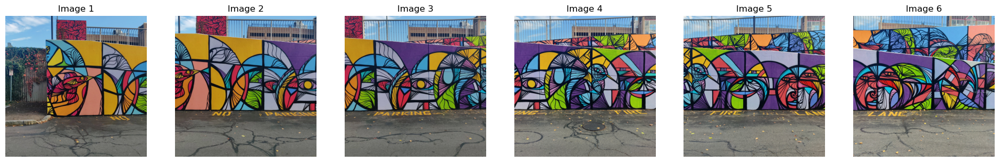

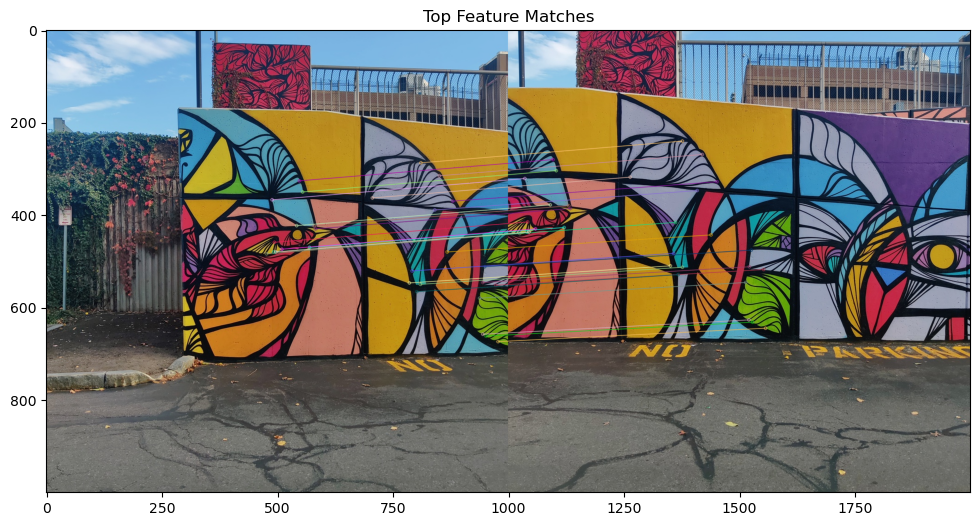

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 149


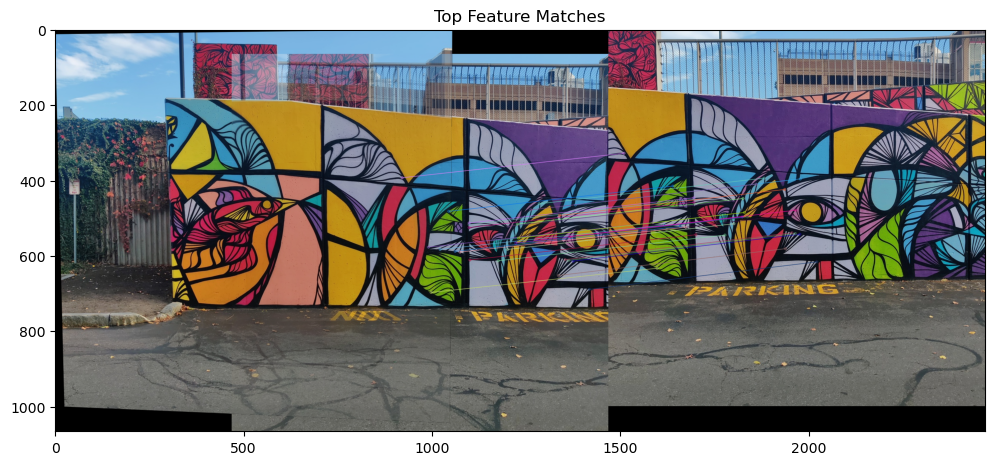

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 206


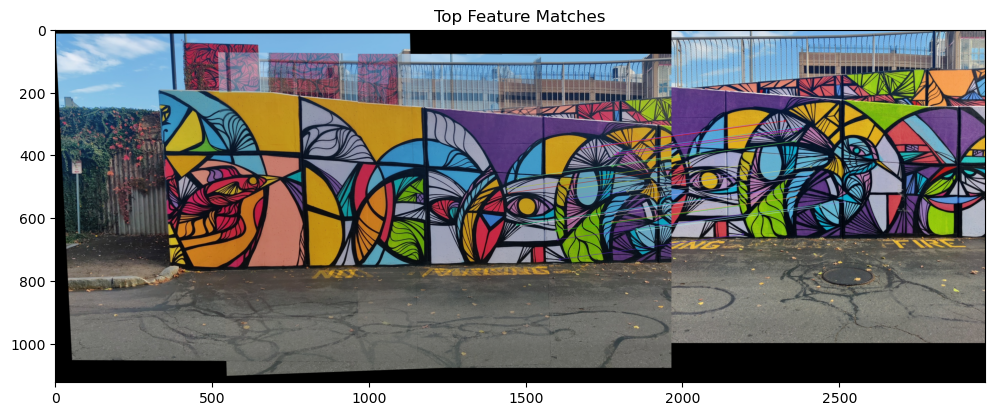

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 195


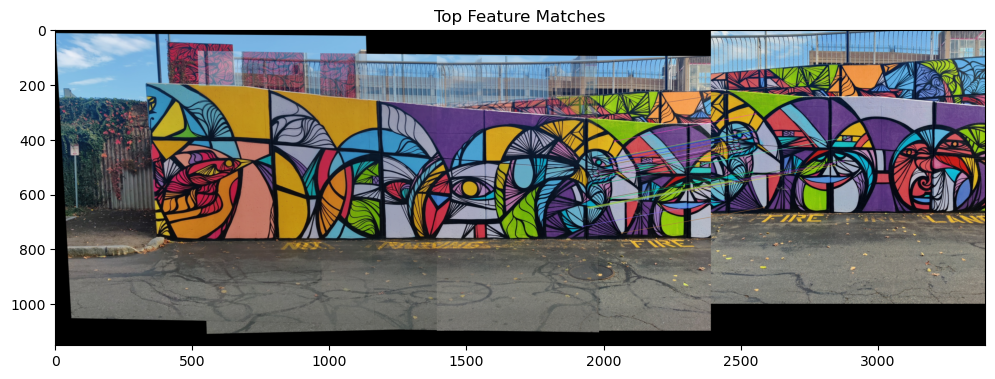

Stitching image 4 and 5...
Number of good matches between stitched image and image 5: 127


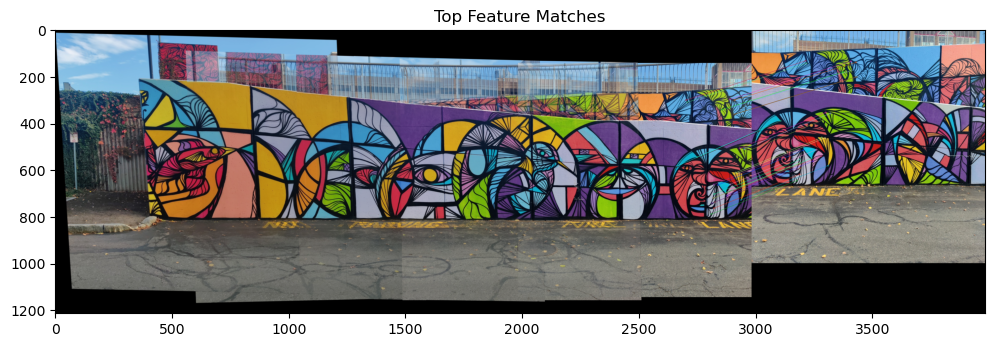

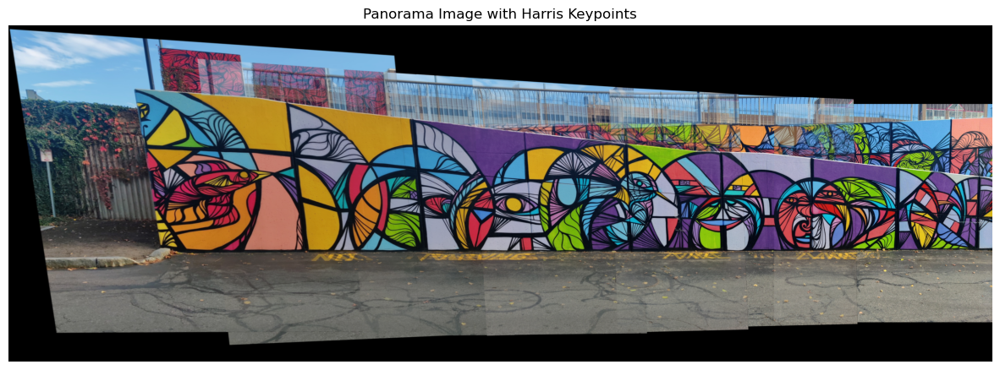

In [7]:
path = "data/graphic_overlap_50/"
images = load_images(path)
panorama = create_panorama(images)

# Display the final panorama
plt.figure(figsize=(15, 10))
plt.imshow(panorama)
plt.title("Panorama Image with Harris Keypoints")
plt.axis("off")
plt.show()
# N < 1000

Images loaded successfully!
Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 136


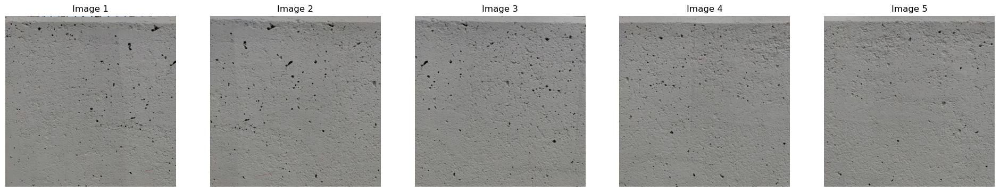

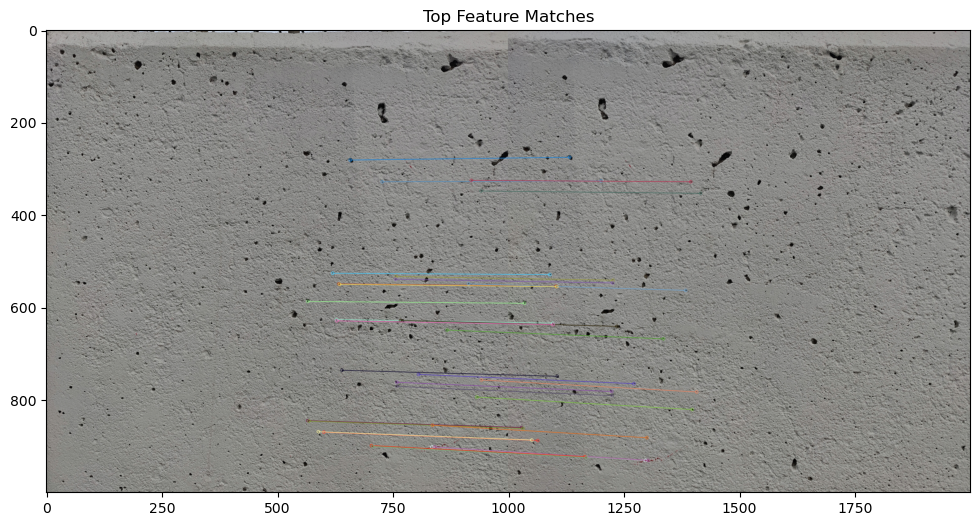

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 229


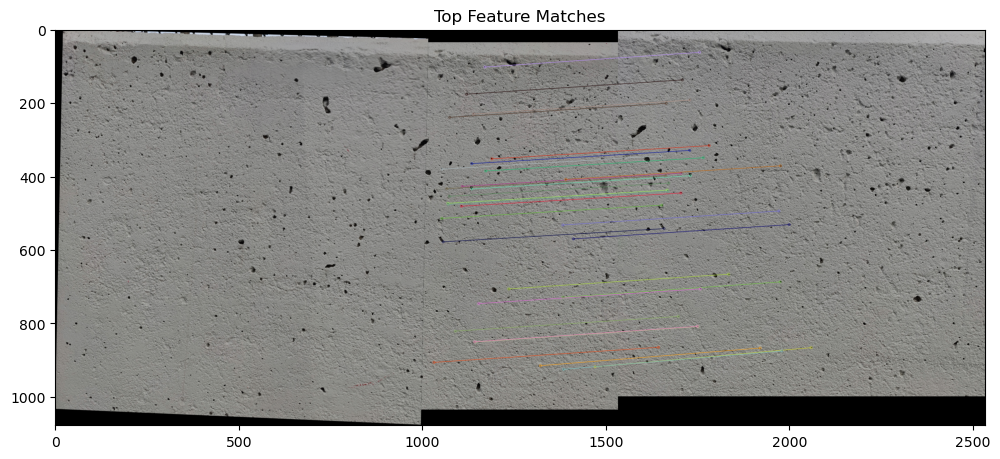

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 159


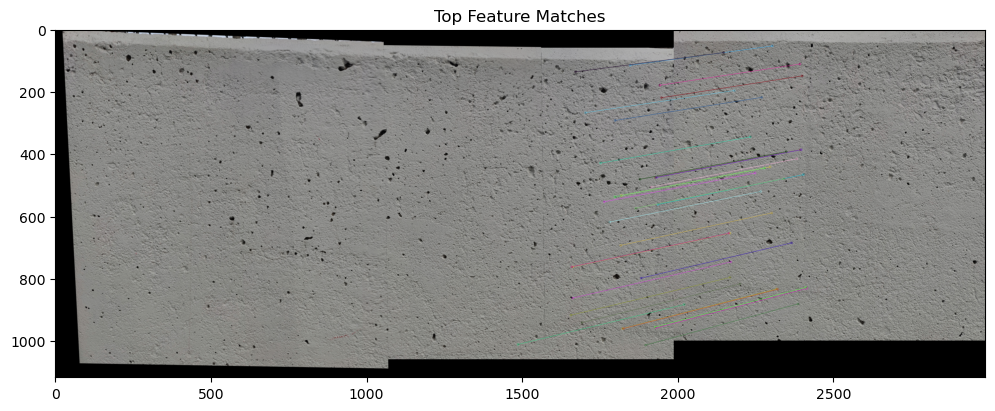

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 127


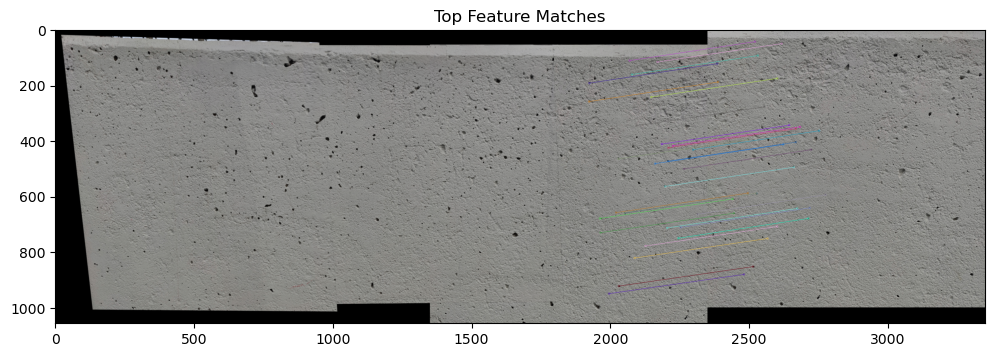

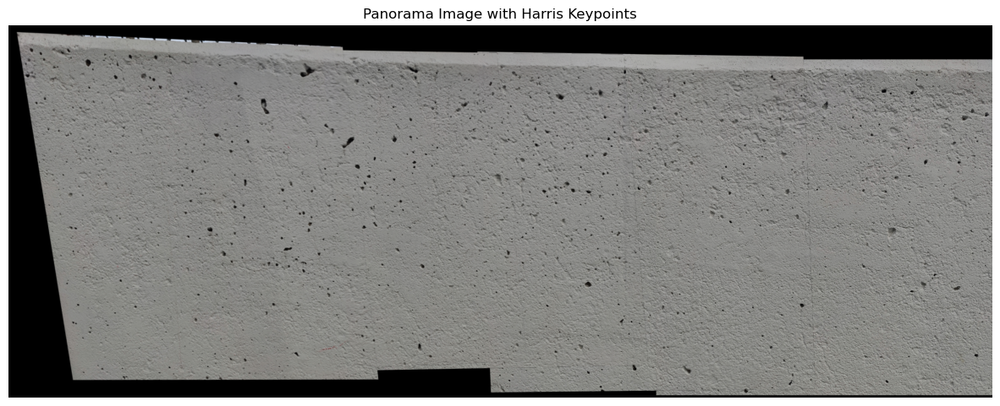

In [8]:
path = "data/cinder_wall/"
images = load_images(path)
panorama = create_panorama(images)

# Display the final panorama
plt.figure(figsize=(15, 10))
plt.imshow(panorama)
plt.title("Panorama Image with Harris Keypoints")
plt.axis("off")
plt.show()

Images loaded successfully!
Stitching image 0 and 1...
Number of good matches between stitched image and image 1: 108


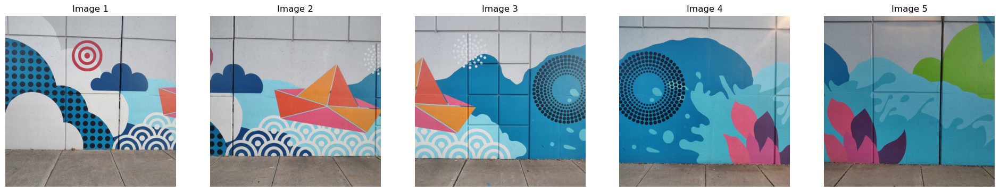

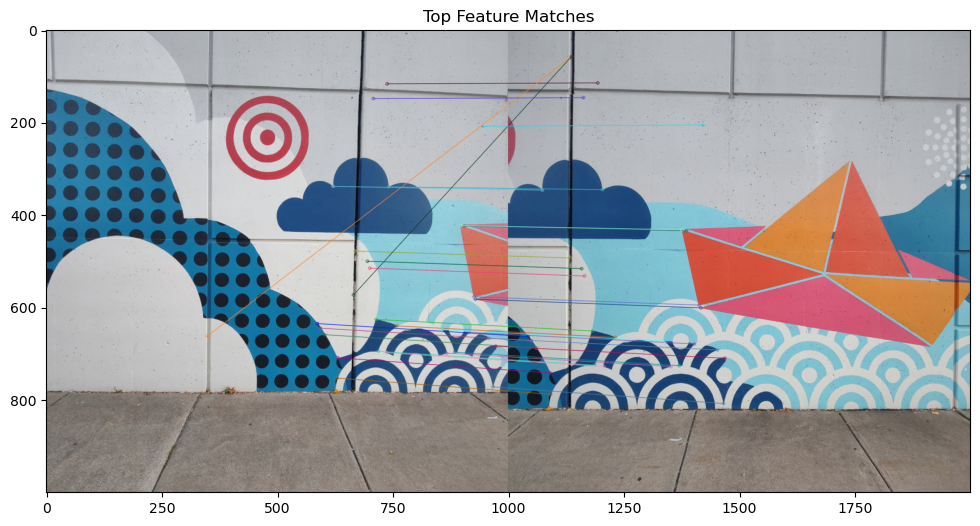

Stitching image 1 and 2...
Number of good matches between stitched image and image 2: 46


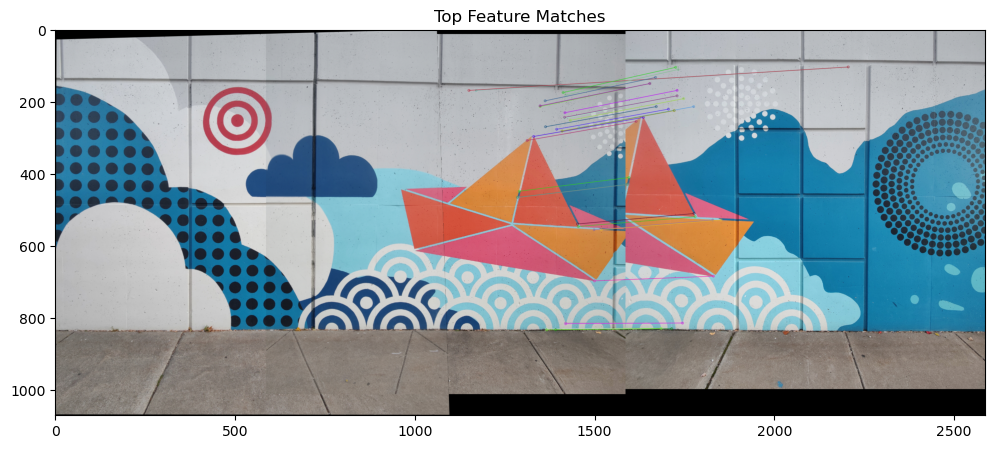

Stitching image 2 and 3...
Number of good matches between stitched image and image 3: 28


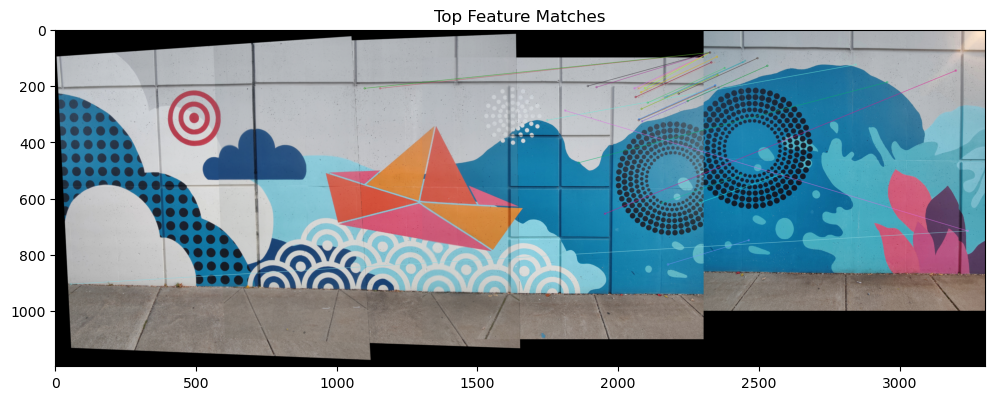

Stitching image 3 and 4...
Number of good matches between stitched image and image 4: 19


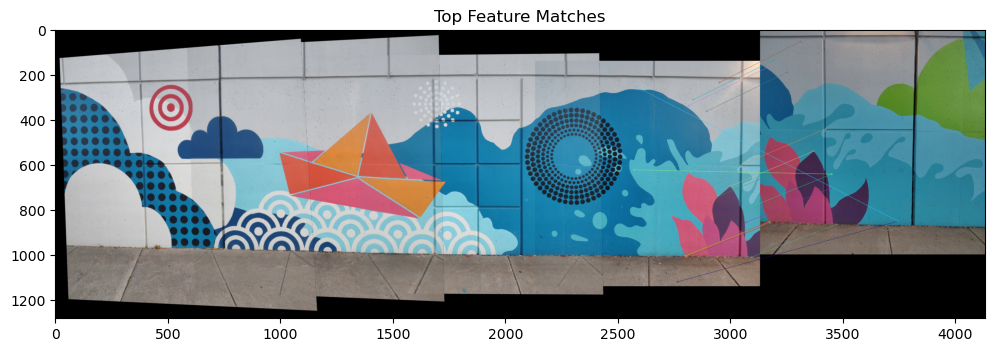

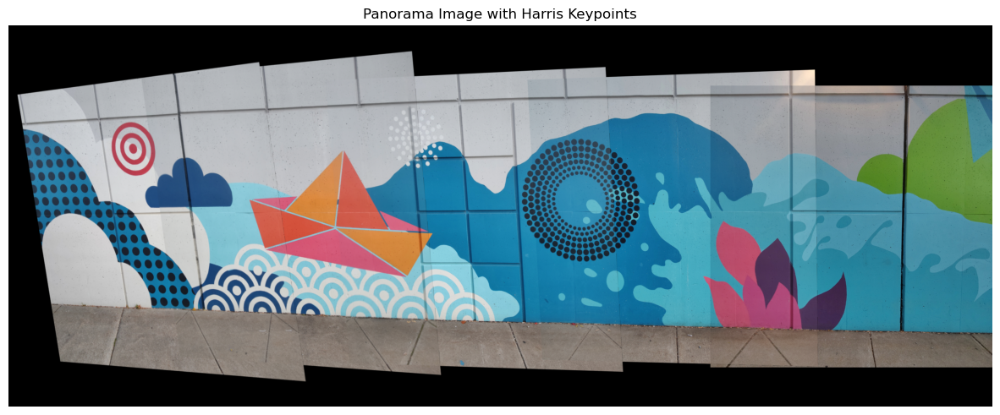

In [9]:
path = "data/graphic_overlap_15/"
images = load_images(path)
panorama = create_panorama(images)

# Display the final panorama
plt.figure(figsize=(15, 10))
plt.imshow(panorama)
plt.title("Panorama Image with Harris Keypoints")
plt.axis("off")
plt.show()

The Harris corner detection algorithm identifies points of interest, or "corners," in an image, which are crucial for tasks like feature matching in panoramic stitching. Although the Harris function was provided in this assignment, it required the images to be converted to grayscale first. This conversion is necessary because the algorithm relies on intensity gradients, which measure changes in brightness between adjacent pixels.

In color images, each pixel has multiple channels (Red, Green, and Blue), each with its own intensity, adding complexity to the process. By converting to grayscale, we reduce the image to a single intensity channel, simplifying corner detection and ensuring consistent feature identification across the image.

I followed the given process to create a panoramic mosaic using the Harris feature detector. I started by capturing images of a mural on campus with around 15% overlap between each shot. To maintain consistency, I moved parallel to the mural, holding the camera in a steady pose. Despite my efforts to minimize movement, slight hand shifts introduced unintended rotations and minor misalignments, which impacted the overall stitching accuracy in the final mosaic.

For the Harris feature detector, I used the following parameters: 
disp: False, 
N: 500, 
thresh: 0.01, 
hsize: 3, 
sigma: 0.5, 
eig: False, 
tile: [1, 1], 
mask: None,
fft: False

These values were determined through trial and error on earlier datasets with higher overlap (50%), which are the images of a cinder block wall and another mural of 50 percent overlap, and I did not modify these values for the 15% overlap dataset.

Few crossed keypoints observed while stitching images in the 15% overlap dataset likely indicate a mismatch in feature alignment due to unintended misalignment in the captured images. Although the intended motion was strictly horizontal along the X-axis, slight hand rotations or tilts during capture could have introduced small shifts in the Y-axis or even angular changes. These minor movements would affect the feature alignment, causing some keypoints to appear slightly misaligned vertically, confusing the feature-matching process and resulting in crossed keypoints. Additionally, with only 15% overlap, there are fewer shared features between the images, which limits the algorithm's ability to identify corresponding points accurately. If the mural contains repetitive or ambiguous patterns, the algorithm might incorrectly match points across similar-looking shapes, further contributing to the crossed keypoint effect.

Despite the reduced overlap, the algorithm was able to stitch the images into a cohesive panorama. However, due to the limited overlap and slight movements during image capture, the resulting panorama displayed minor distortions and warping. 

These misalignments are likely due to the small variations in camera angle and position as I moved. In summary, the algorithm worked well with a 15% overlap, but the final result was affected by distortions caused by slight inconsistencies in camera positioning and by using feature detector parameters optimized for datasets with higher overlap.